# Anomaly Detection
<div align="right"><i>FP, May 2019</i></div>

Goal: detect defected items in a dataset of images. 

In [5]:
import keras
import numpy as np
import matplotlib.pyplot as plt
import skimage
from sklearn.metrics import auc
from keras.layers import Convolution2D, MaxPooling2D, Flatten, Dense, Lambda, GlobalMaxPooling2D, Activation
from keras.models import Sequential
from keras.losses import mse
from random import shuffle
import sklearn
from sklearn.utils import class_weight
from keras import backend as K

# Training and testing

In [48]:
# images without defects
ra_below_0_4 = [1265, 1266, 1267, 1268, 1064, 1079, 1279, 1280, 1281, 1290, 1354, 1355, 1356, 1357, 1035, 1036, 1040, 1041, 805, 808, 812, 814, 1424, 1425, 1426, 1429, 1498, 1503, 1511, 1516, 1571, 1572, 1574, 1577]
ra_0_6 = [1651, 1653, 1654, 1656, 1659, 1660, 1663, 1664, 1668, 1670, 1671, 1673, 1674, 1675, 1678, 1679]
ra_0_8 = [1804, 1805, 1807, 1808]
ra_1 = [1882, 1883, 1885, 1892]
ra_1_12 = [1959, 1961, 1962, 1963]
ra_1_26 = [2035, 2036, 2037, 2039]
ra_1_4 = [2211, 2212, 2213, 2214]
ra_1_62 = [2288, 2290, 2291, 2292]
others = [2365, 2366, 2367, 2368, 2442, 2443, 2444, 2445, 2519, 2520, 2521, 2522, 5960, 5961, 5962, 5963, 6036, 6037, 6038, 6039, 6114, 6115, 6116, 6117, 6192, 6193, 6194, 6195] + [1153, 1197, 1228, 12429, 12575, 14241, 15595, 15649, 15665, 15707, 15801] 
all_non_defected = ra_below_0_4 + ra_0_6 + ra_0_8 + ra_1 + ra_1_12 + ra_1_26 + ra_1_4 + ra_1_62 + others

# images with defects
black = [1325, 1405, 7533, 7762, 8764, 8795, 11633, 15660, 16296, 16494, 17278, 17873, 17877, 18094, 18266, 18489]#+list(range(12490, 12557))#6447, 1103, , 17896, 18067
cleaning = [7517, 8926, 8936, 11501, 15589, 15676, 15726, 15764, 17313]
edge = [8004, 8015, 8026, 8037, 8048, 8059, 8070, 12810, 12820, 12876, 12886, 12897, 12963]
illumination = [11230, 12403, 12444, 12445, 12446, 12447, 12448, 12449, 12450, 12451, 12452, 12453, 12454, 12455, 12456, 12458, 12459, 12461, 12462, 12463, 12464, 12465, 12466, 12467, 1248, 12470, 12471, 12472, 12473, 12474, 12475, 12476, 12477, 12478, 1247, 12480, 12481, 12482, 12483, 12484, 12485, 12486, 12487, 12488, 12559, 12560, 12823, 14176, 17091]
focus = [18397]
white = [999999]
all_defected = black + cleaning + edge + illumination + focus + white

normal = ra_below_0_4
outliers = black

# Random permutation of the training + testing datasets
normal = list(np.random.permutation(normal))
outliers = list(np.random.permutation(outliers))

nr_normal, nr_outliers = len(normal)*4, len(outliers)*4
print("length training and testing set:", nr_outliers+nr_normal)

#option: save dataset (normal1, normal2 or normal3)
#np.save('normal2', normal)
#np.save('outliers2', outliers)nr_normal = len(normal)*4
print("length training and testing set:", nr_outliers)

length training and testing set: 200
length training and testing set: 64


### Preprocessing

In [49]:
#choose between (dataset1, dataset2 or dataset3)
normal = np.load('normal1.npy')
outliers = np.load('outliers1.npy')

In [50]:
size = 20
value = -0.005
im_shape = [480, 752]

model1 = Sequential()
model1.add(Convolution2D(1, size, use_bias=False, input_shape=(im_shape[0], im_shape[1], 1)))
model1.add(MaxPooling2D(size, size))
W = model1.layers[0].get_weights()
W[0].fill(value)
model1.layers[0].set_weights(W)

In [51]:
def load_image(img_nr):
    img = skimage.io.imread('Images/Original/%s.png'%str(img_nr).zfill(6))
    return img

def inner_loop(img_nr):
    img = load_image(img_nr)
    img = (img.astype('float32') / 255)
    heatmap = img
    heatmap = model1.predict(img.reshape(1, img.shape[0], img.shape[1], 1))
    heatmap = np.abs(heatmap-np.mean(heatmap))    
    return heatmap 
    
def compute_heatmaps():
    heatmaps = []
    heatmap_nr = []
    for j in range(len(normal)):
        temp = inner_loop(normal[j])
        heatmaps.append(temp)
        heatmaps.append(np.flip(temp, axis=0))
        heatmaps.append(np.flip(temp, axis=1))#        print(temp.shape, np.flip)
        heatmaps.append(np.flip(temp))    
        for k in range(4):
            heatmap_nr.append(normal[j])
    for j in range(len(outliers)):
        temp = inner_loop(outliers[j])
        heatmaps.append(temp)
        heatmaps.append(np.flip(temp, axis=0))
        heatmaps.append(np.flip(temp, axis=1))#        print(temp.shape, np.flip)
        heatmaps.append(np.flip(temp))    
        for k in range(4):
            heatmap_nr.append(outliers[j])

    return heatmaps, heatmap_nr

heatmaps, heatmap_nr = compute_heatmaps() 
heatmaps = np.squeeze(np.asarray(heatmaps))
heatmaps.shape

(200, 23, 36)

# Neural Network

In [52]:
#inputs and outputs
x = heatmaps/np.max(heatmaps)
y = np.concatenate([np.zeros((nr_normal)), np.ones((nr_outliers))])

indeces_training = list(range(nr_normal*2//3)) + list(range(len(x)-nr_outliers*2//3, len(x)))
indeces_testing = list(range(nr_normal*2//3, len(x)-nr_outliers*2//3))

In [53]:
#neural network
opt = keras.optimizers.Adam(lr=0.1, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)

model = Sequential()
model.add(Convolution2D(5, 5, input_shape=(heatmaps.shape[1], heatmaps.shape[2], 1)))
model.add(GlobalMaxPooling2D())
model.add(Dense(1))
model.add(Activation('sigmoid'))
model.compile(loss='mse', optimizer=opt, metrics=['accuracy'])
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_9 (Conv2D)            (None, 19, 32, 5)         130       
_________________________________________________________________
global_max_pooling2d_5 (Glob (None, 5)                 0         
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 6         
_________________________________________________________________
activation_5 (Activation)    (None, 1)                 0         
Total params: 136
Trainable params: 136
Non-trainable params: 0
_________________________________________________________________


In [54]:
cw = class_weight.compute_class_weight('balanced', np.unique(y[indeces_training]), y[indeces_training])
model.fit(x[indeces_training].reshape(len(x[indeces_training]), heatmaps.shape[1], heatmaps.shape[2], 1), y[indeces_training], 
          validation_data=(x[indeces_testing].reshape(len(x[indeces_testing]), heatmaps.shape[1], heatmaps.shape[2], 1), y[indeces_testing]), 
          class_weight=cw, 
          callbacks = [],
          epochs=100)

Train on 132 samples, validate on 68 samples
Epoch 1/100
132/132 [==============================] - 0s 3ms/step - loss: 0.2149 - acc: 0.6364 - val_loss: 0.0843 - val_acc: 0.9853
Epoch 2/100
132/132 [==============================] - 0s 317us/step - loss: 0.1036 - acc: 0.8712 - val_loss: 0.0540 - val_acc: 0.9559
Epoch 3/100
132/132 [==============================] - 0s 327us/step - loss: 0.0608 - acc: 0.9545 - val_loss: 0.0058 - val_acc: 1.0000
Epoch 4/100
132/132 [==============================] - 0s 297us/step - loss: 0.0538 - acc: 0.9318 - val_loss: 0.0133 - val_acc: 1.0000
Epoch 5/100
132/132 [==============================] - 0s 389us/step - loss: 0.0424 - acc: 0.9470 - val_loss: 0.0592 - val_acc: 0.9412
Epoch 6/100
132/132 [==============================] - 0s 367us/step - loss: 0.0459 - acc: 0.9318 - val_loss: 0.0206 - val_acc: 0.9706
Epoch 7/100
132/132 [==============================] - 0s 279us/step - loss: 0.0355 - acc: 0.9545 - val_loss: 0.0219 - val_acc: 0.9706
Epoch 8/100


132/132 [==============================] - 0s 247us/step - loss: 2.9324e-04 - acc: 1.0000 - val_loss: 0.0142 - val_acc: 0.9853
Epoch 61/100
132/132 [==============================] - 0s 283us/step - loss: 2.9347e-04 - acc: 1.0000 - val_loss: 0.0131 - val_acc: 0.9853
Epoch 62/100
132/132 [==============================] - 0s 249us/step - loss: 2.9166e-04 - acc: 1.0000 - val_loss: 0.0137 - val_acc: 0.9853
Epoch 63/100
132/132 [==============================] - 0s 246us/step - loss: 2.7703e-04 - acc: 1.0000 - val_loss: 0.0152 - val_acc: 0.9853
Epoch 64/100
132/132 [==============================] - 0s 282us/step - loss: 2.7003e-04 - acc: 1.0000 - val_loss: 0.0175 - val_acc: 0.9706
Epoch 65/100
132/132 [==============================] - 0s 287us/step - loss: 2.7831e-04 - acc: 1.0000 - val_loss: 0.0206 - val_acc: 0.9706
Epoch 66/100
132/132 [==============================] - 0s 215us/step - loss: 2.7439e-04 - acc: 1.0000 - val_loss: 0.0187 - val_acc: 0.9706
Epoch 67/100
132/132 [===========

In [55]:
# model.save_weights('model2_3')

In [56]:
# Find ideal threshold
from keras import backend as K

W = model.layers[2].get_weights()
a = W[0][0][0]
b = W[1][0]
c = np.max(heatmaps)

threshold = (b/-a)*c
threshold

0.21338056

# Evaluation

In [57]:
index = indeces_training
x1 = x[index]
y1 = y[index]

### Accuracy

In [58]:
accuracy = model.evaluate(x1.reshape(len(x1), x1.shape[1], x1.shape[2], 1), y1)[1]
print ("Accuracy:", accuracy)

132/132 [==============================] - 0s 134us/step
Accuracy: 1.0


### Confusion Matrix

In [59]:
# Legend:
# TP   FN
# FP   TN

X = np.round(np.squeeze(model.predict(x1.reshape(len(x1), x1.shape[1], x1.shape[2], 1))))
Y = y1
print ("Confusion matrix:\n", sklearn.metrics.confusion_matrix(Y, X))

Confusion matrix:
 [[90  0]
 [ 0 42]]


### ROC Curve

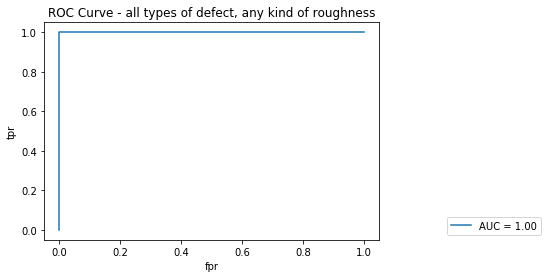

In [60]:
predictions = model.predict(x1.reshape(len(x1), 23, 36, 1))[:,0]

def plot_ROC():
    tpr = []
    fpr = []
    for threshold in np.arange(0,1.1, 0.01):
        tpr.append(len(np.where(predictions[y1==0]<threshold)[0])/np.sum(y1==0))
        fpr.append(len(np.where(predictions[y1==1]<threshold)[0])/np.sum(y1==1))
    plt.xlim(-0.05, 1.05)
    plt.ylim(-0.05, 1.05)
    plt.xlabel("fpr")
    plt.ylabel("tpr")
    plt.title("ROC Curve - all types of defect, any kind of roughness")
    plt.plot(fpr, tpr, label= 'AUC = %0.2f' % auc(fpr, tpr))
    plt.legend(loc = 4, bbox_to_anchor=(1.50, 0))
    plt.show()
    return fpr, tpr

fpr, tpr = plot_ROC()

# Predictions

In [61]:
def plot(i):
    print(i)
    title = ['normal', 'defected']
    plt.figure(figsize=(8, 4))
    ax = plt.subplot(1, 2, 1)
    img = load_image(heatmap_nr[index[i]])
    plt.imshow(img)
    plt.title('image %d: %s' %(i, title[int(y1[i])]))
    ax = plt.subplot(1, 2, 2)
    print(np.max(heatmaps[i].reshape(heatmaps.shape[1], heatmaps.shape[2])))
    plt.imshow(heatmaps[index[i]].reshape(heatmaps.shape[1], heatmaps.shape[2]), vmin=0, vmax=1)
    prediction = int(np.round(model.predict(x1.reshape(len(x1), 23, 36, 1))[i]))
    plt.title('prediction: %s' %title[prediction])
    plt.show()

### Classification mistakes

In [62]:
for i in range(len(x1)):
    if(int(y1[i]) != (np.round(model.predict(x1.reshape(len(x1), 23, 36, 1))[i]))%2):
        plot(i)

### All predictions

0
0.15209743


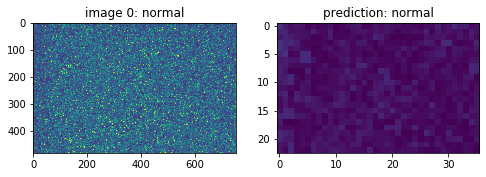

1
0.15209743


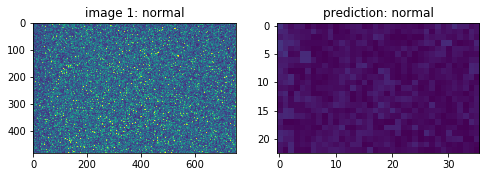

2
0.15209743


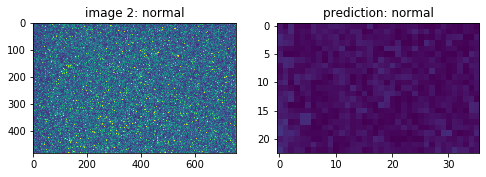

3
0.15209743


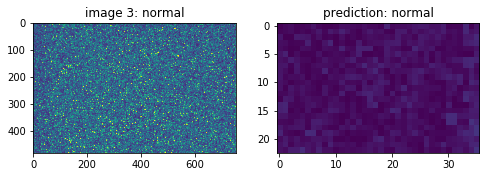

4
0.15947068


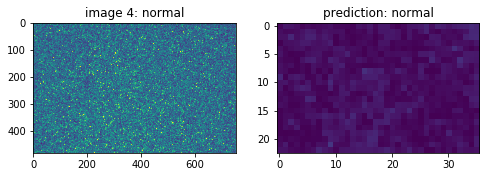

5
0.15947068


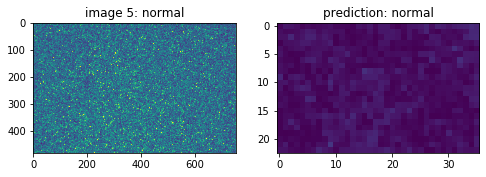

6
0.15947068


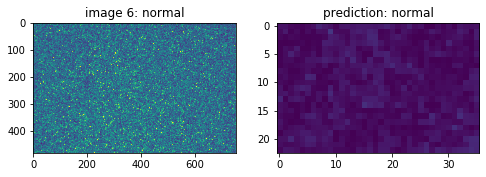

7
0.15947068


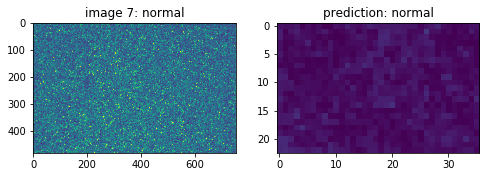

8
0.16826773


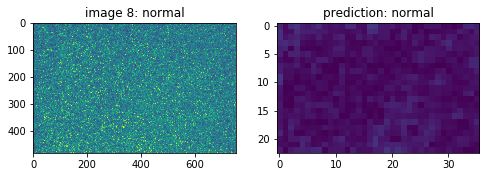

9
0.16826773


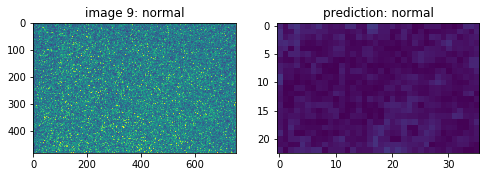

10
0.16826773


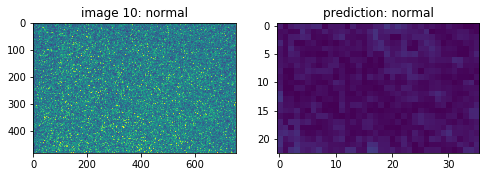

11
0.16826773


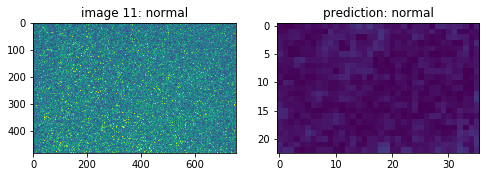

12
0.15814167


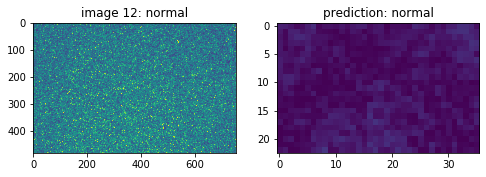

13
0.15814167


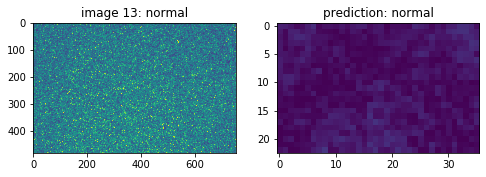

14
0.15814167


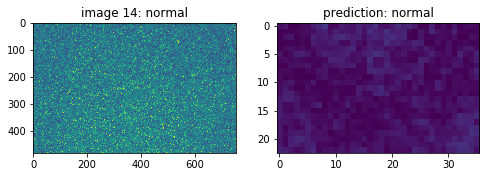

15
0.15814167


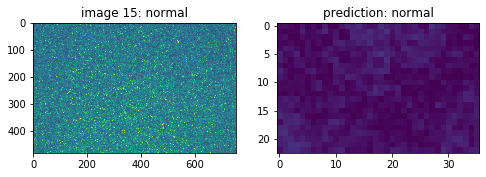

16
0.14377385


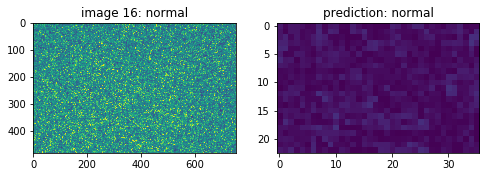

17
0.14377385


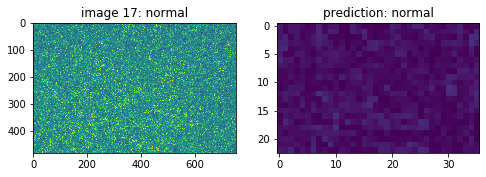

18
0.14377385


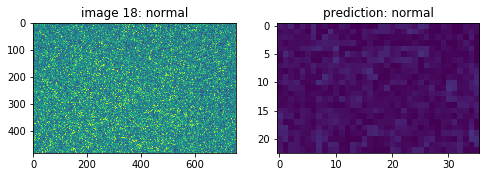

19
0.14377385


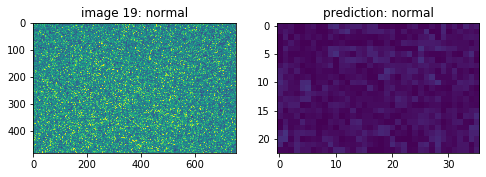

20
0.17409402


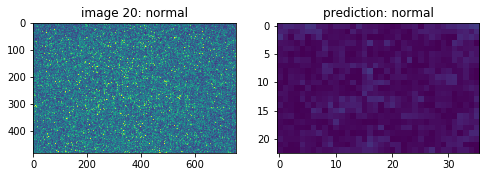

21
0.17409402


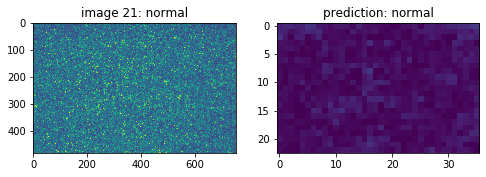

22
0.17409402


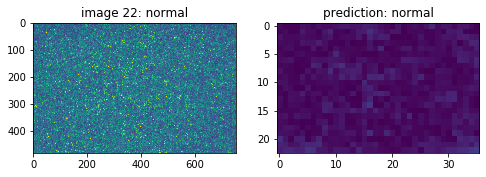

23
0.17409402


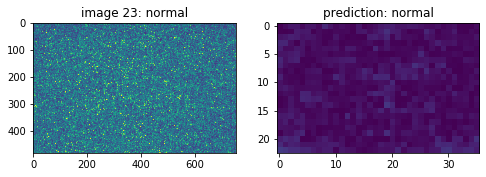

24
0.19276029


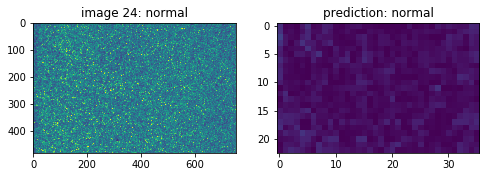

25
0.19276029


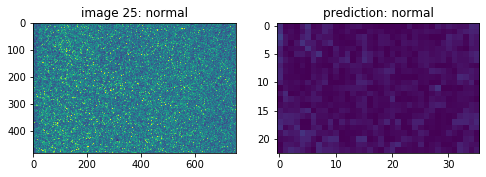

26
0.19276029


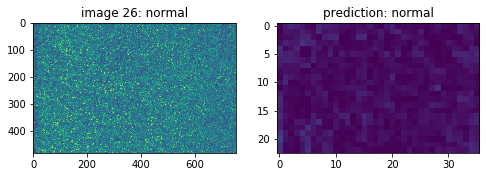

27
0.19276029


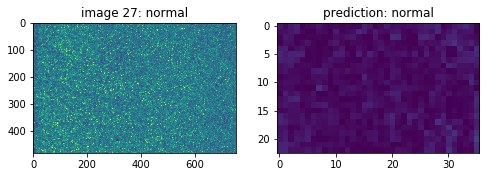

28
0.17522192


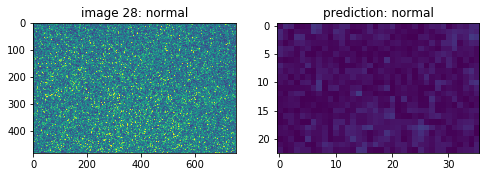

29
0.17522192


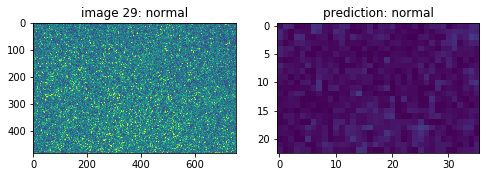

30
0.17522192


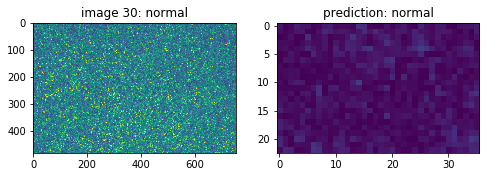

31
0.17522192


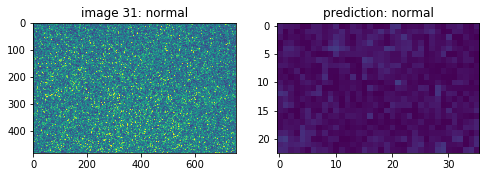

32
0.1826151


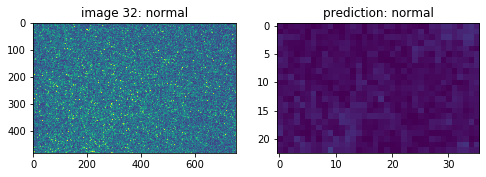

33
0.1826151


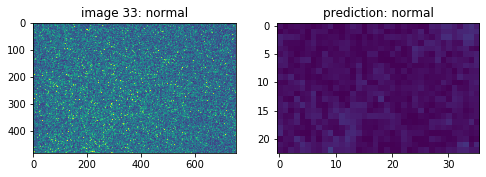

34
0.1826151


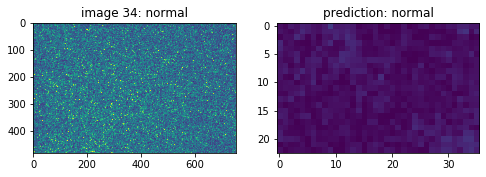

35
0.1826151


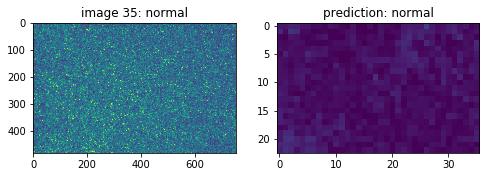

36
0.14720088


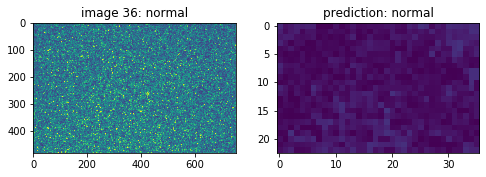

37
0.14720088


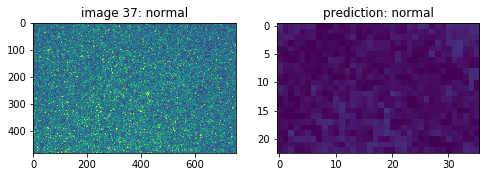

38
0.14720088


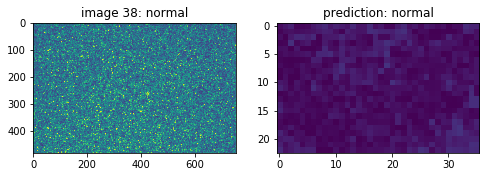

39
0.14720088


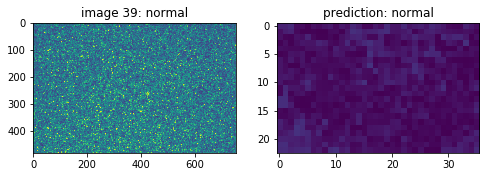

40
0.18826425


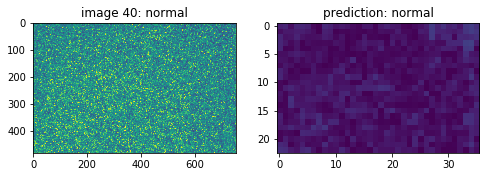

41
0.18826425


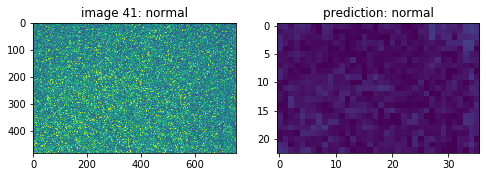

42
0.18826425


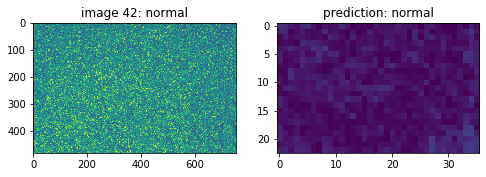

43
0.18826425


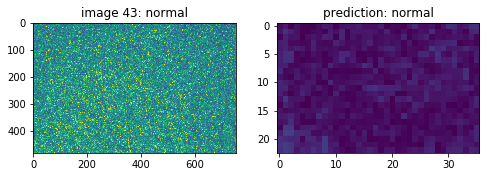

44
0.18750781


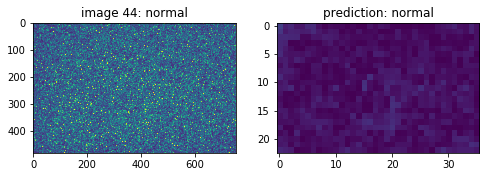

45
0.18750781


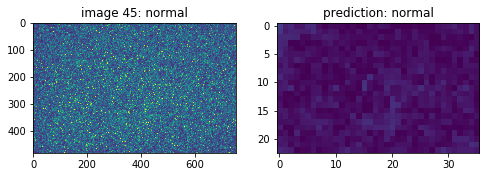

46
0.18750781


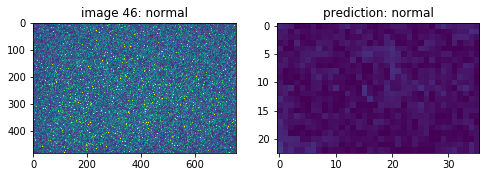

47
0.18750781


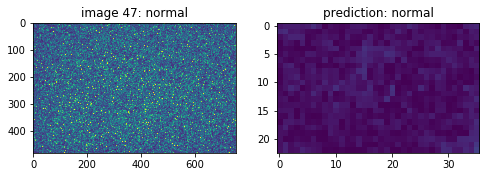

48
0.19756526


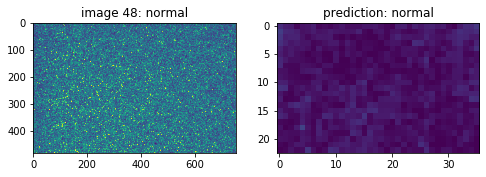

49
0.19756526


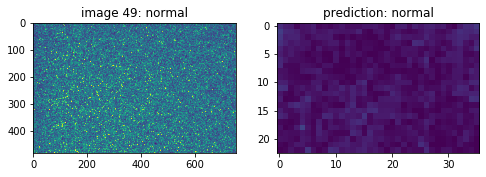

50
0.19756526


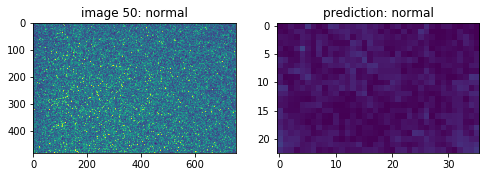

51
0.19756526


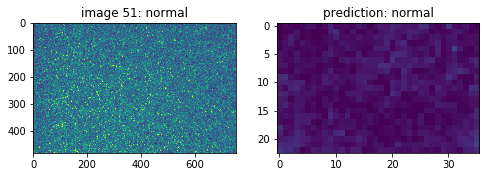

52
0.15234795


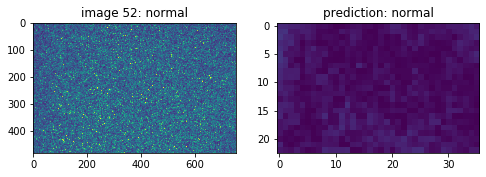

53
0.15234795


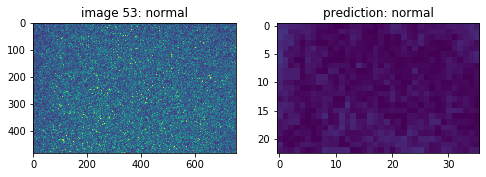

54
0.15234795


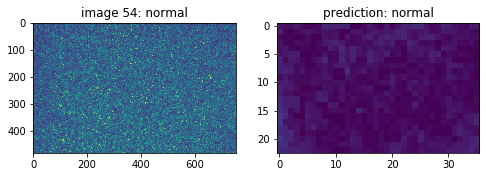

55
0.15234795


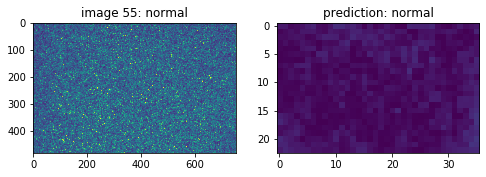

56
0.14632389


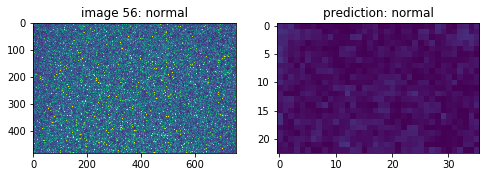

57
0.14632389


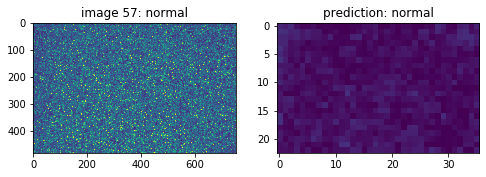

58
0.14632389


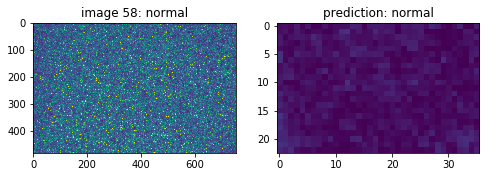

59
0.14632389


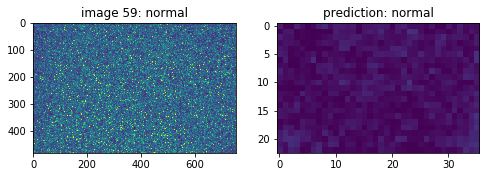

60
0.17622179


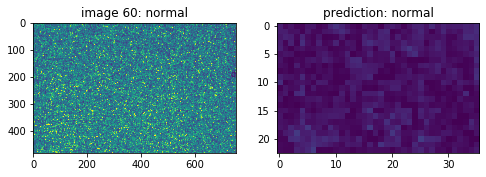

61
0.17622179


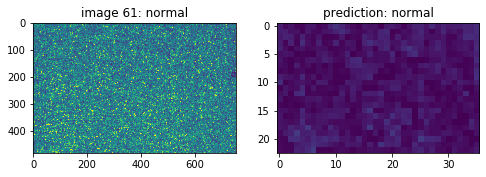

62
0.17622179


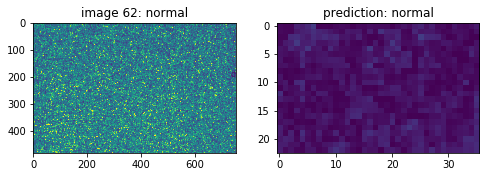

63
0.17622179


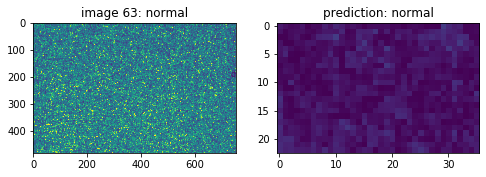

64
0.13519031


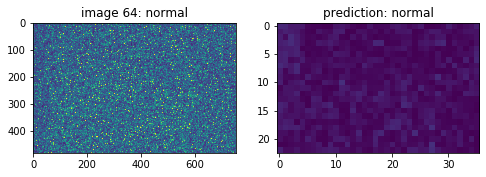

65
0.13519031


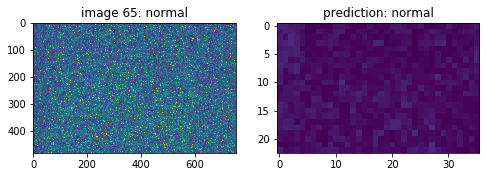

66
0.13519031


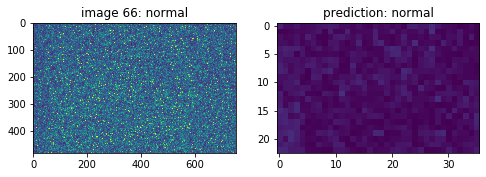

67
0.13519031


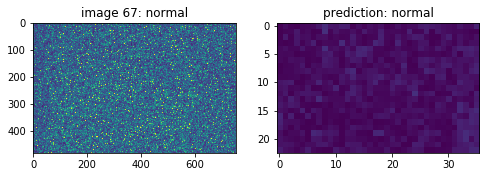

68
0.15681356


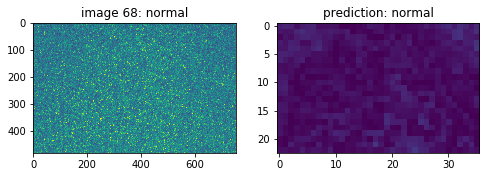

69
0.15681356


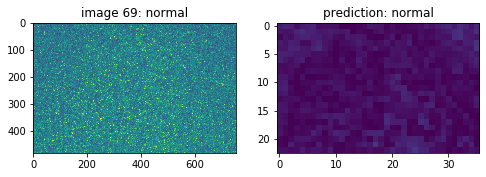

70
0.15681356


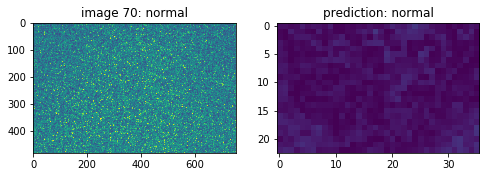

71
0.15681356


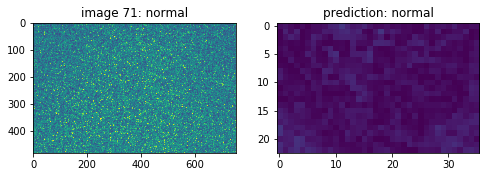

72
0.2158159


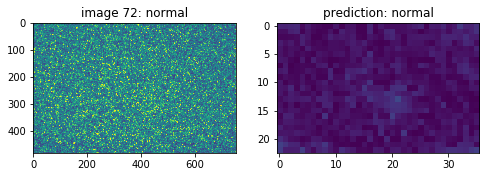

73
0.2158159


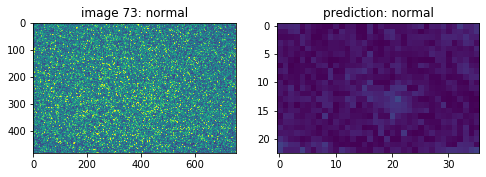

74
0.2158159


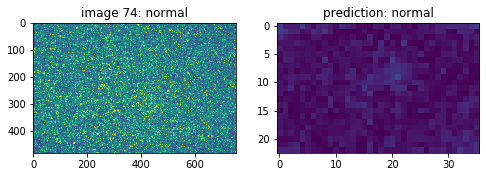

75
0.2158159


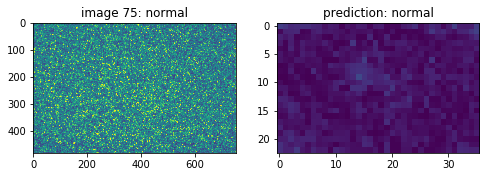

76
0.19776833


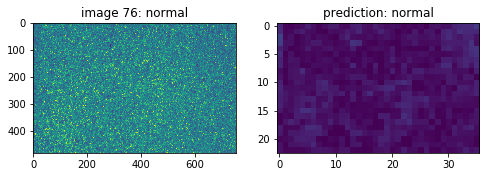

77
0.19776833


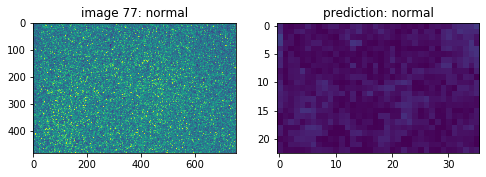

78
0.19776833


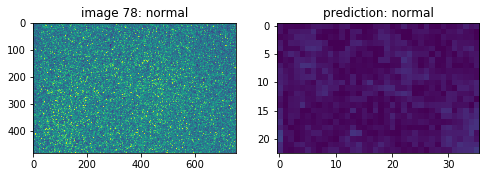

79
0.19776833


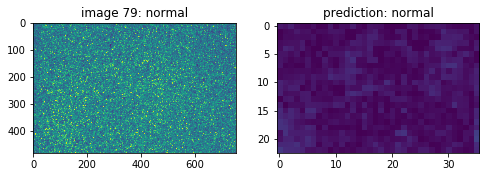

80
0.19982594


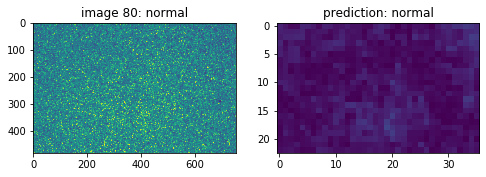

81
0.19982594


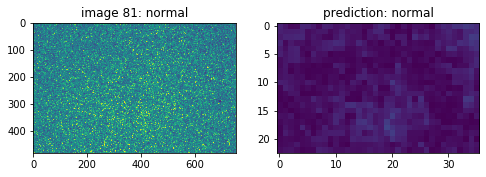

82
0.19982594


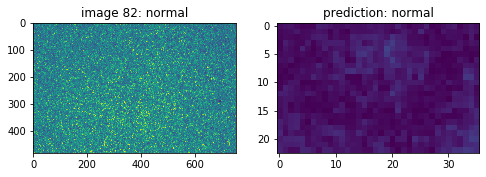

83
0.19982594


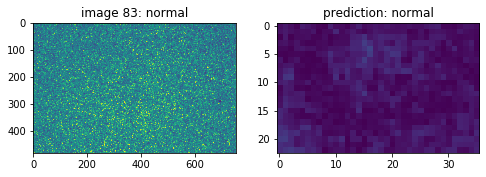

84
0.22161973


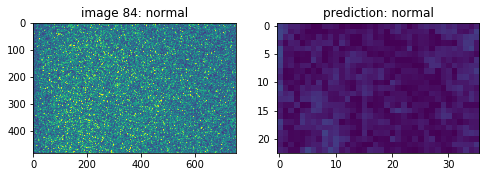

85
0.22161973


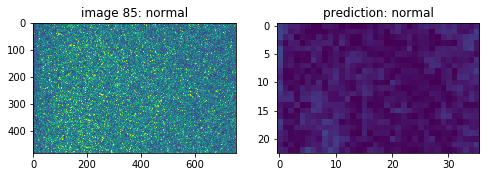

86
0.22161973


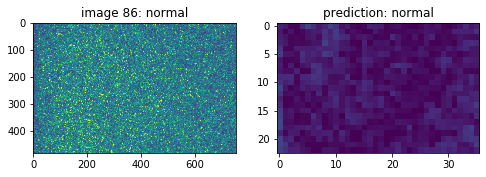

87
0.22161973


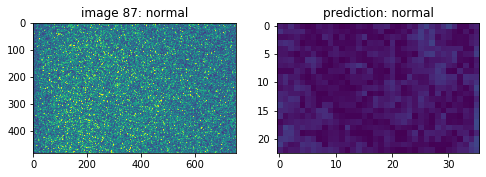

88
0.15088105


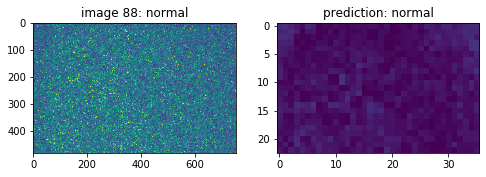

89
0.15088105


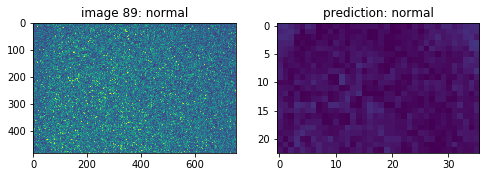

90
0.15088105


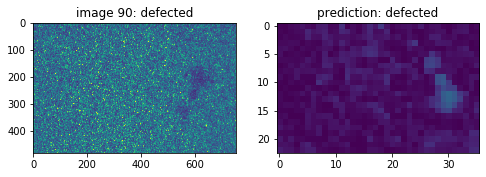

91
0.15088105


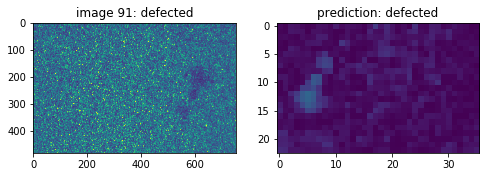

92
0.1612727


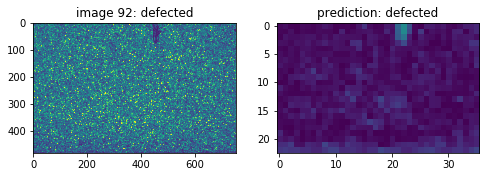

93
0.1612727


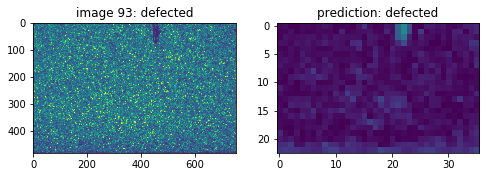

94
0.1612727


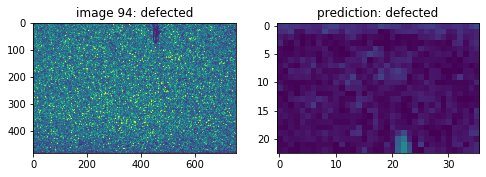

95
0.1612727


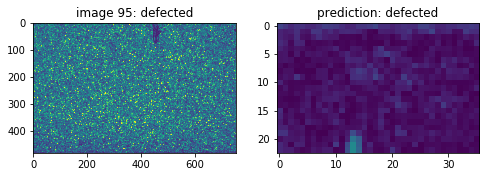

96
0.14784157


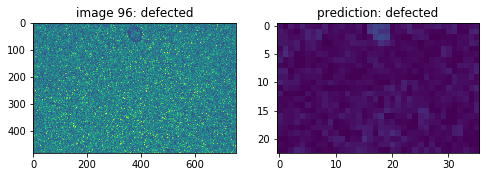

97
0.14784157


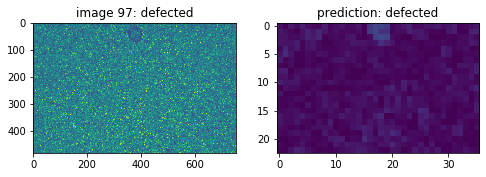

98
0.14784157


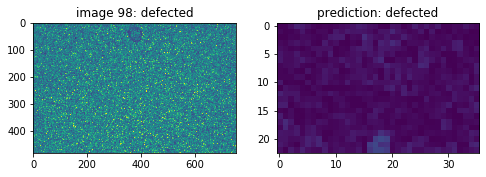

99
0.14784157


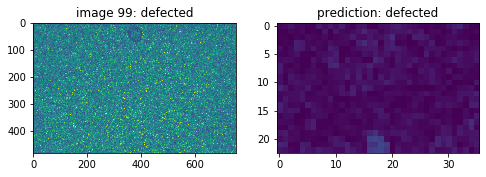

100
0.18335557


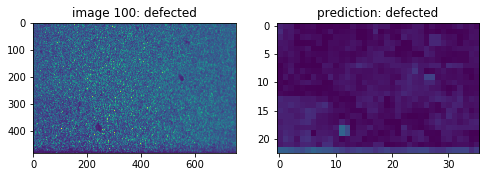

101
0.18335557


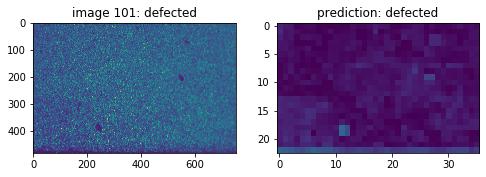

102
0.18335557


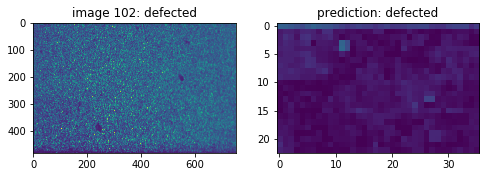

103
0.18335557


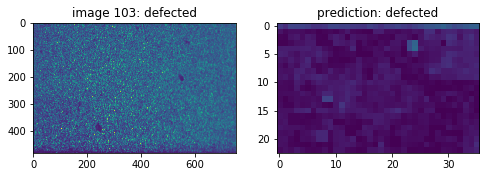

104
0.21469456


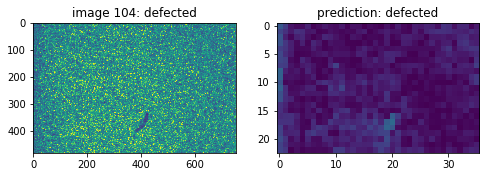

105
0.21469456


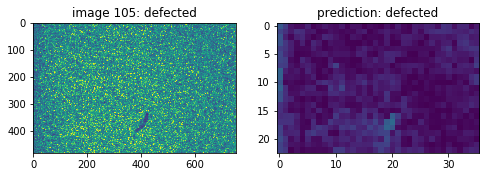

106
0.21469456


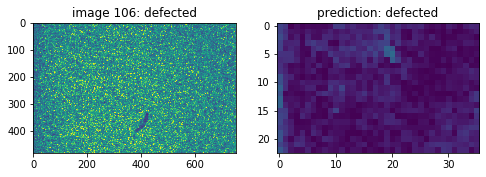

107
0.21469456


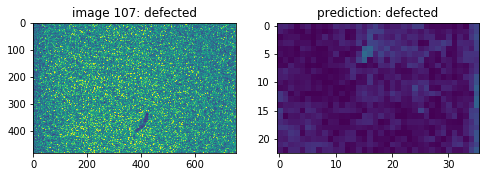

108
0.16560161


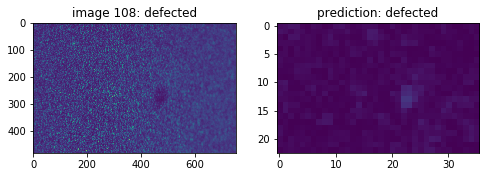

109
0.16560161


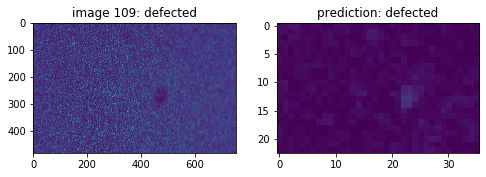

110
0.16560161


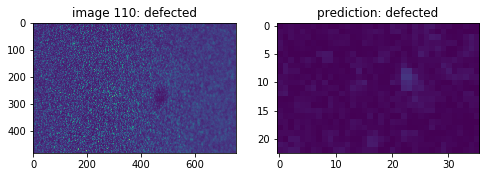

111
0.16560161


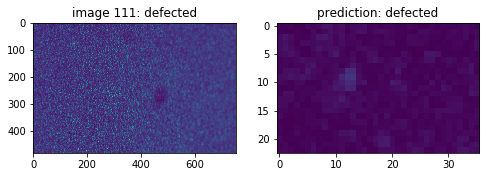

112
0.16733646


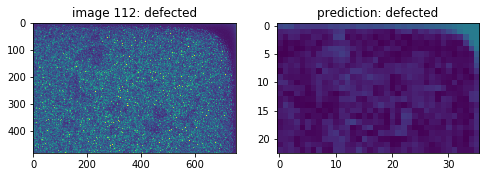

113
0.16733646


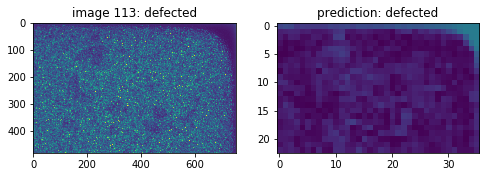

114
0.16733646


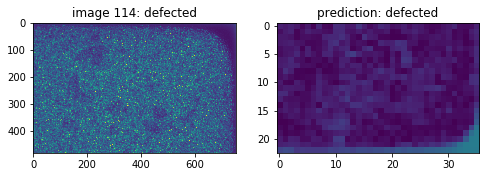

115
0.16733646


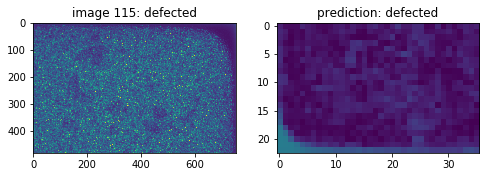

116
0.22214329


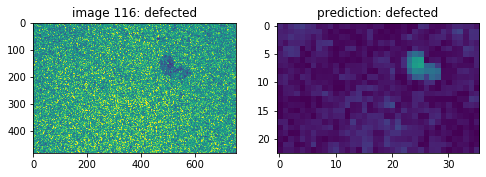

117
0.22214329


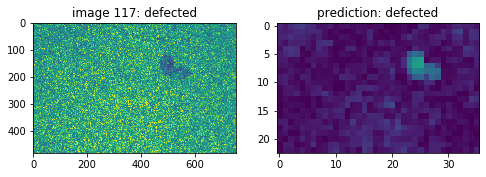

118
0.22214329


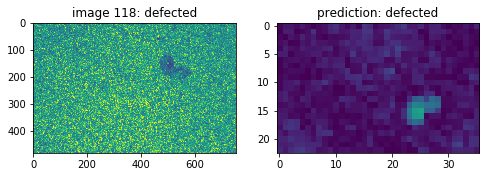

119
0.22214329


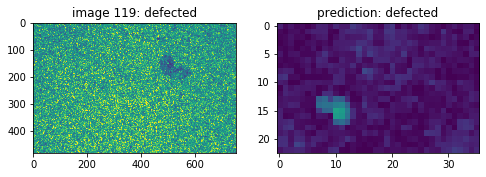

120
0.1527518


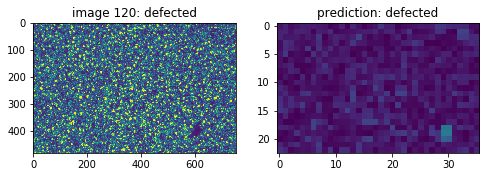

121
0.1527518


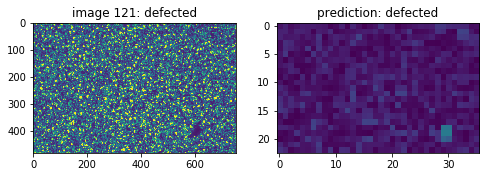

122
0.1527518


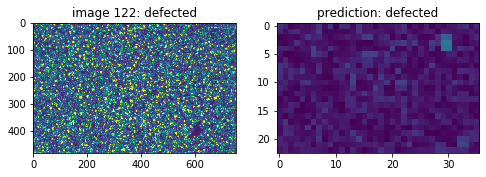

123
0.1527518


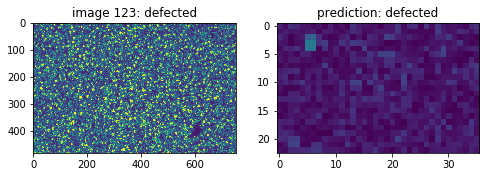

124
0.1778974


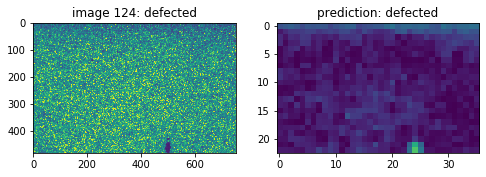

125
0.1778974


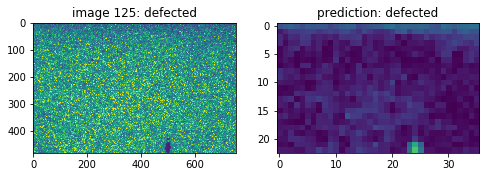

126
0.1778974


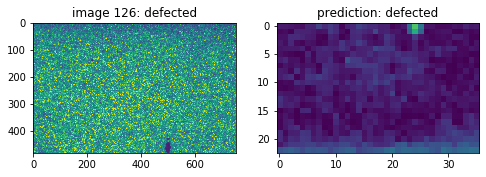

127
0.1778974


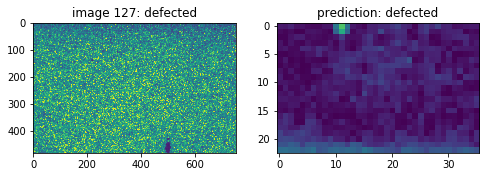

128
0.26746088


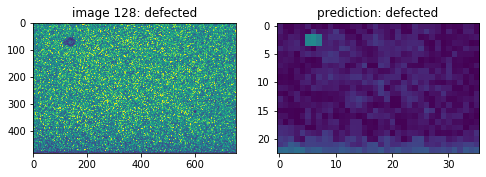

129
0.26746088


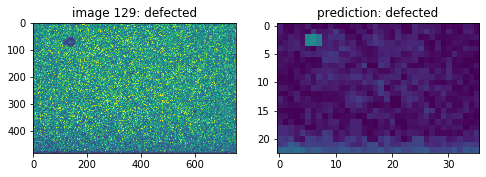

130
0.26746088


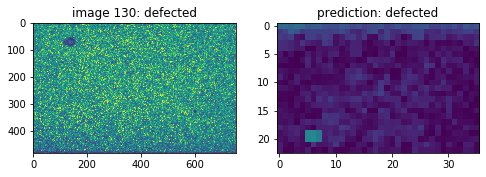

131
0.26746088


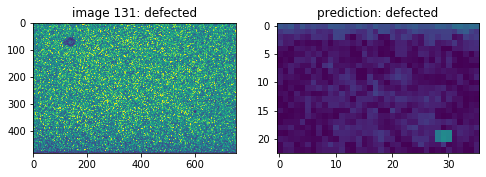

In [63]:
for i in range(len(x1)):
    plot(i)